# Unsupervised Learning Project - Part-3

## Automobile Domain

In [1]:
#Importing packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

## Data Processing

In [2]:
#Importing dataset
df = pd.read_csv('Part3 - vehicle.csv')
df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [3]:
#Shape of dataset
df.shape

(846, 19)

In [4]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


In [5]:
df.dtypes.to_frame(name = 'Data Type')

,Data Type
compactness,int64
circularity,float64
distance_circularity,float64
radius_ratio,float64
pr.axis_aspect_ratio,float64
max.length_aspect_ratio,int64
scatter_ratio,float64
elongatedness,float64
pr.axis_rectangularity,float64
max.length_rectangularity,int64


In [6]:
#null check
df.isnull().any()

compactness                    False
circularity                     True
distance_circularity            True
radius_ratio                    True
pr.axis_aspect_ratio            True
max.length_aspect_ratio        False
scatter_ratio                   True
elongatedness                   True
pr.axis_rectangularity          True
max.length_rectangularity      False
scaled_variance                 True
scaled_variance.1               True
scaled_radius_of_gyration       True
scaled_radius_of_gyration.1     True
skewness_about                  True
skewness_about.1                True
skewness_about.2                True
hollows_ratio                  False
class                          False
dtype: bool

In [7]:
# Number of null/missing values
df.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [8]:
#Replace missing/null value with NaN value
df = df.replace('?', np.nan)

In [9]:
#Check the medians for the attributes.
df.median()

compactness                     93.0
circularity                     44.0
distance_circularity            80.0
radius_ratio                   167.0
pr.axis_aspect_ratio            61.0
max.length_aspect_ratio          8.0
scatter_ratio                  157.0
elongatedness                   43.0
pr.axis_rectangularity          20.0
max.length_rectangularity      146.0
scaled_variance                179.0
scaled_variance.1              363.5
scaled_radius_of_gyration      173.5
scaled_radius_of_gyration.1     71.5
skewness_about                   6.0
skewness_about.1                11.0
skewness_about.2               188.0
hollows_ratio                  197.0
dtype: float64

In [10]:
# In order to clean the data either missing value in a row can be dropped or replaced with median. 
#Second approach is chosen in order to retain the other data in the row

for i in df.columns[df.isnull().any(axis=0)]:     #Applying on variables with NaN values
    df[i].fillna(df[i].mean(),inplace=True)

In [11]:
#null check
df.isnull().any()

compactness                    False
circularity                    False
distance_circularity           False
radius_ratio                   False
pr.axis_aspect_ratio           False
max.length_aspect_ratio        False
scatter_ratio                  False
elongatedness                  False
pr.axis_rectangularity         False
max.length_rectangularity      False
scaled_variance                False
scaled_variance.1              False
scaled_radius_of_gyration      False
scaled_radius_of_gyration.1    False
skewness_about                 False
skewness_about.1               False
skewness_about.2               False
hollows_ratio                  False
class                          False
dtype: bool

In [12]:
# Dropping class column since it will not be helpful for this scenario/usecase
df = df.drop(['class'], axis=1)
df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183


In [13]:
df.dtypes.to_frame(name = 'Data Type')

,Data Type
compactness,int64
circularity,float64
distance_circularity,float64
radius_ratio,float64
pr.axis_aspect_ratio,float64
max.length_aspect_ratio,int64
scatter_ratio,float64
elongatedness,float64
pr.axis_rectangularity,float64
max.length_rectangularity,int64


In [14]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.00,119.0
circularity,846.0,44.828775,6.133943,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.110451,15.740902,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.888095,33.400979,104.0,141.00,168.0,195.00,333.0
pr.axis_aspect_ratio,846.0,61.678910,7.882119,47.0,57.00,61.0,65.00,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.00,55.0
scatter_ratio,846.0,168.901775,33.195188,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.933728,7.811559,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.582444,2.588326,17.0,19.00,20.0,23.00,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.00,188.0


### Data analysis & visualisation

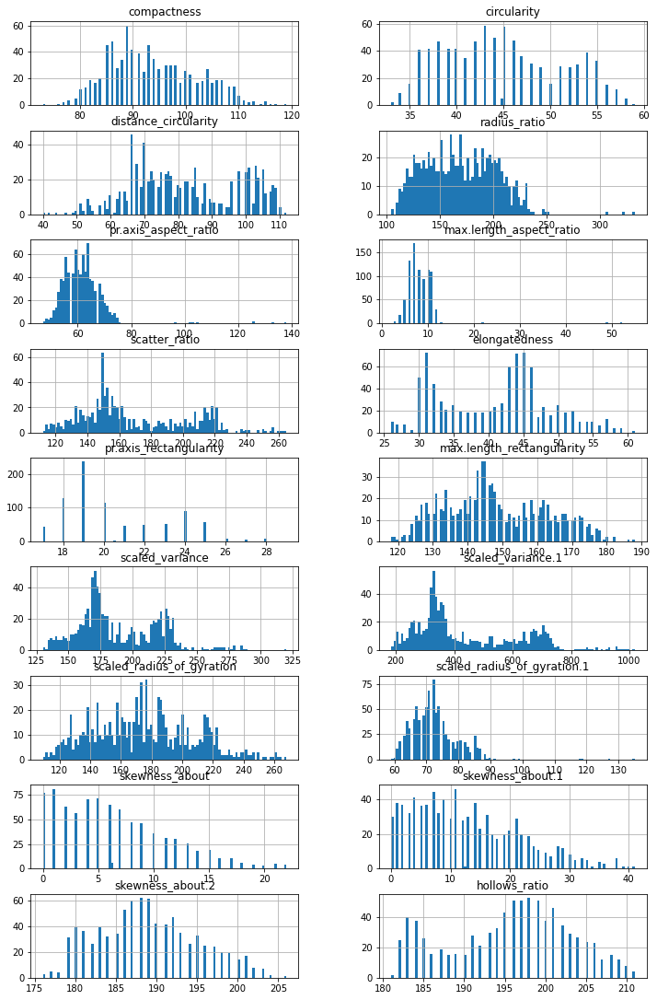

In [15]:
columns = list(df)
df[columns].hist(stacked=False, bins=100, figsize=(12,30), layout=(14,2));

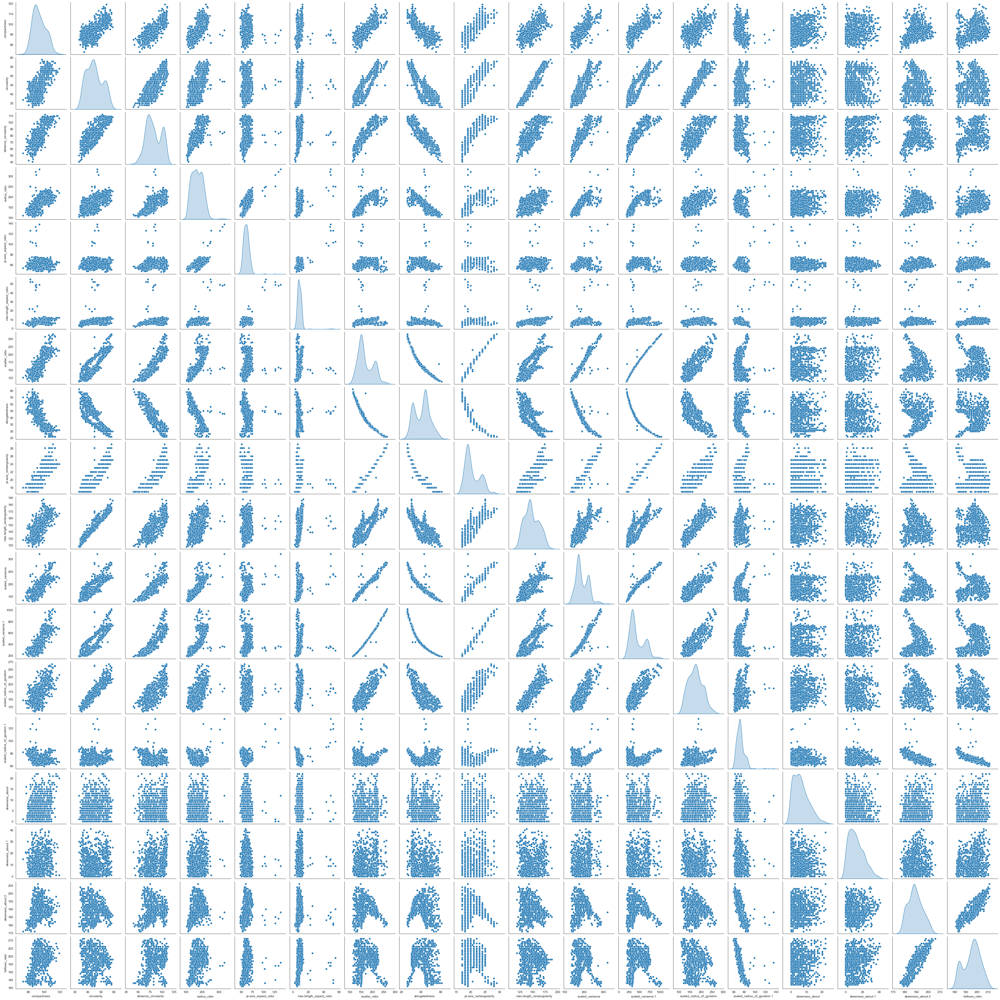

In [16]:
#Bivariate relationships of fields
sns.set_style("white")
sns.pairplot(df, diag_kind='kde')
plt.show()

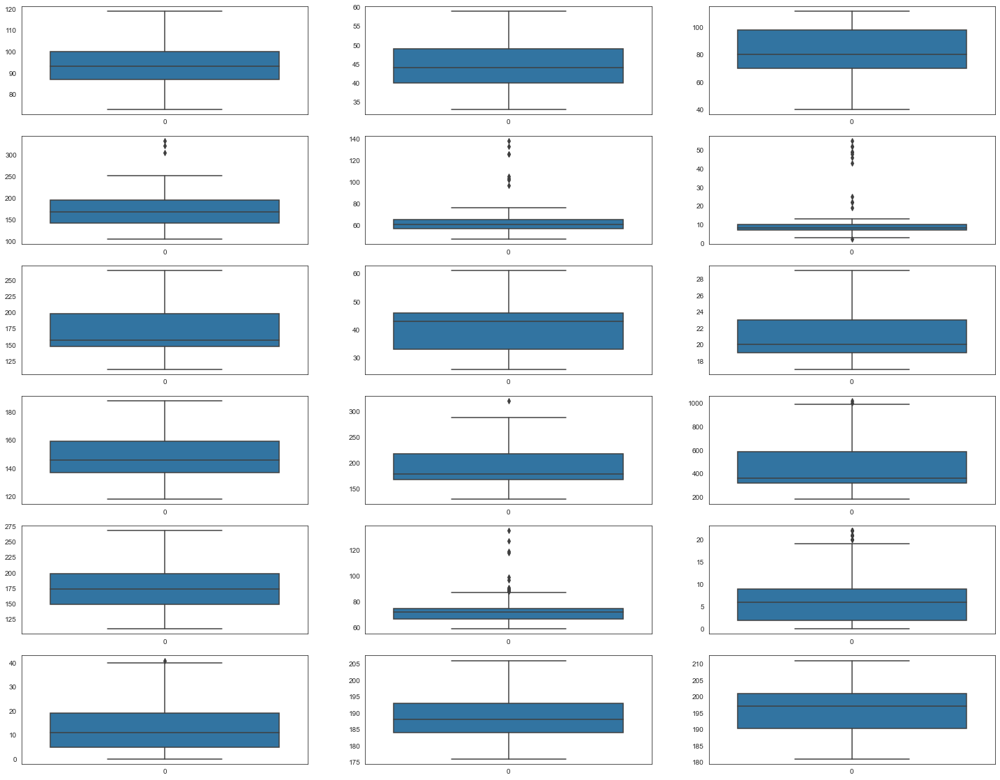

In [17]:
plt.figure(figsize=(25, 20))
col = 1
for i in df.columns:
    plt.subplot(6, 3, col)
    sns.boxplot(data = df[i])
    col += 1 

In [18]:
#Replacing outilers with median
for col_name in df.columns:
    q1 = df[col_name].quantile(0.25)
    q3 = df[col_name].quantile(0.75)
    iqr = q3 - q1
    
    low = q1 - 1.5 * iqr
    high = q3 + 1.5 * iqr
    
    df.loc[(df[col_name] < low) | (df[col_name] > high), col_name] = df[col_name].median()

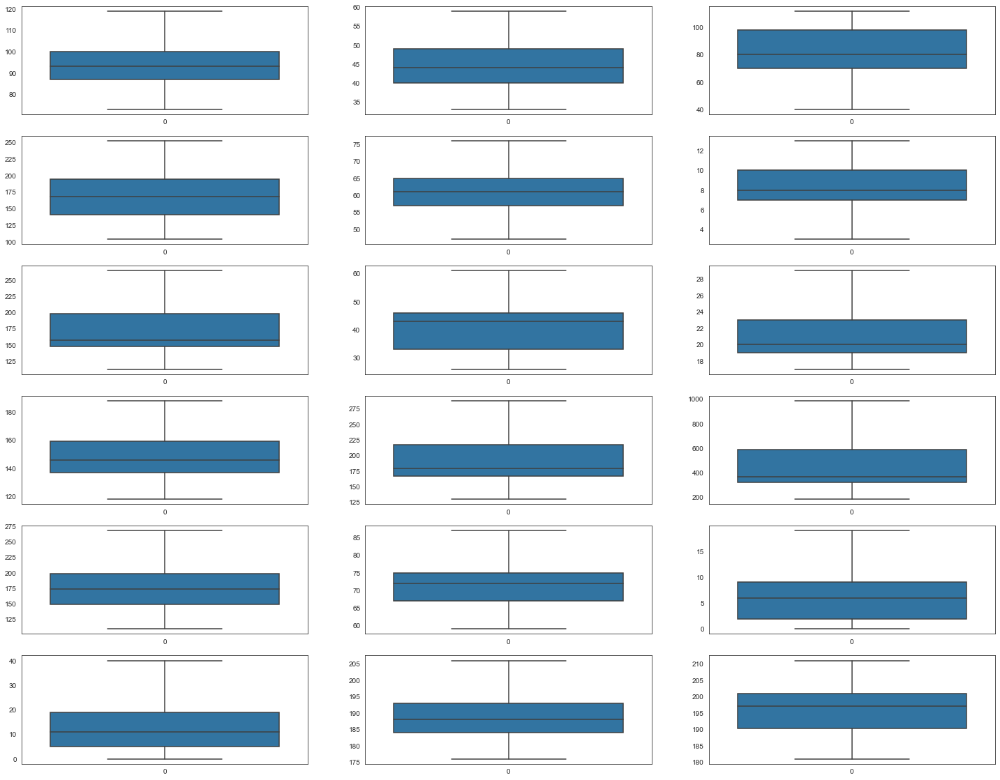

In [19]:
# Plotting box plot after removing outliers
plt.figure(figsize=(25, 20))
col = 1
for i in df.columns:
    plt.subplot(6, 3, col)
    sns.boxplot(data = df[i])
    col += 1 

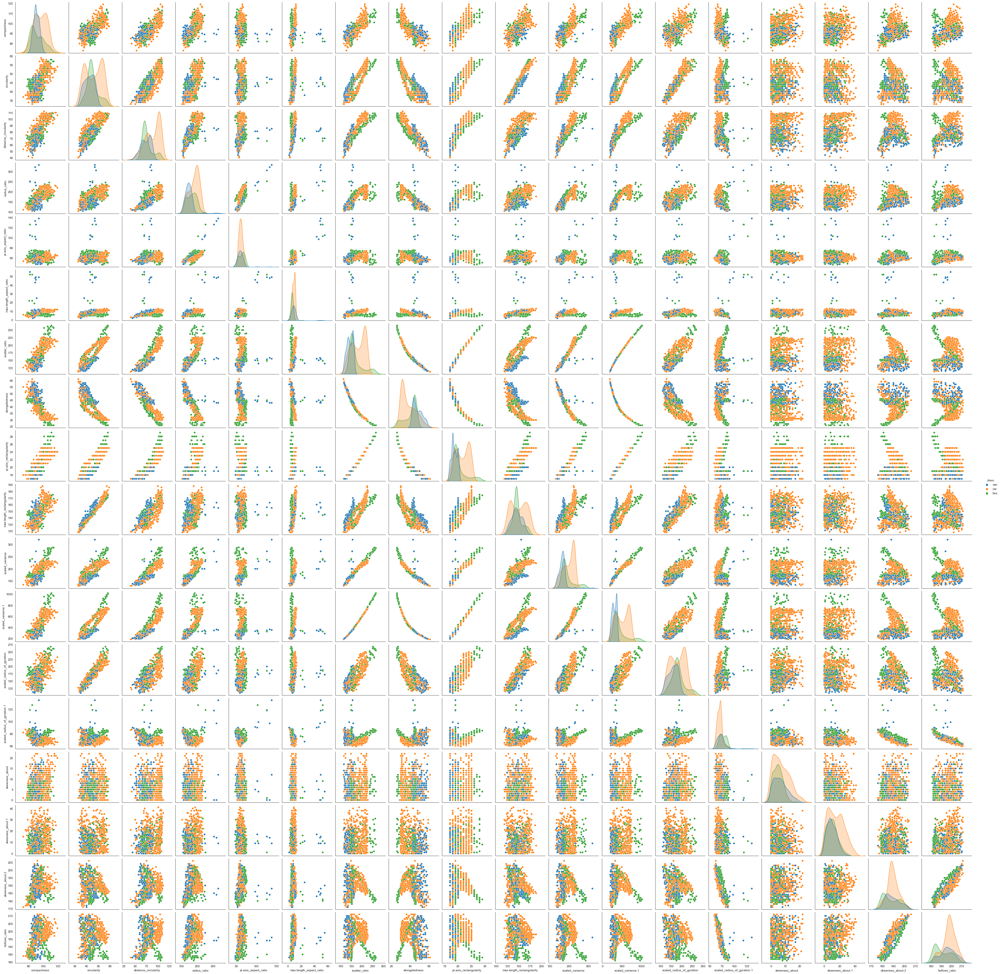

In [20]:
df_new = pd.read_csv('Part3 - vehicle.csv')
sns.pairplot(df_new, diag_kind = 'kde', hue = 'class')

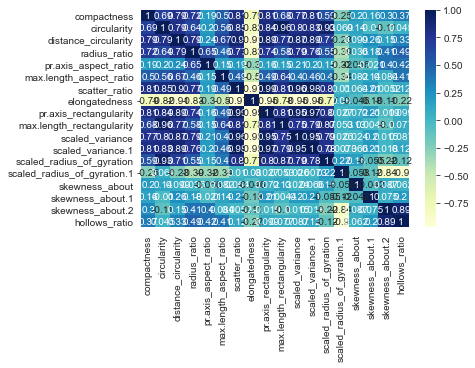

In [21]:
# Plotting the correlation heat map to understand the correlation between variables
sns.heatmap(df.corr(), annot=True, cmap="YlGnBu")
plt.show()

In [22]:
from scipy.stats import zscore
XScaled=df.apply(zscore)
Y = df_new.values[:,18]
Y = pd.DataFrame(Y)
XScaled.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.160580,0.517302,0.056545,0.300420,1.932830,0.912212,-0.208038,0.136580,-0.225160,0.758332,-0.401938,-0.338519,0.285618,-0.317988,-0.032895,0.386956,-0.312193,0.183957
1,-0.325470,-0.624564,0.120112,-0.851200,-0.740875,0.427456,-0.599893,0.520853,-0.611739,-0.344578,-0.595419,-0.619796,-0.513719,0.006954,0.623522,0.161529,0.013088,0.452977
2,1.254193,0.843549,1.518571,1.265291,0.863348,0.912212,1.148382,-1.144331,0.934576,0.689401,1.113664,1.131015,1.392391,0.169425,1.717551,-0.402038,-0.149552,0.049447
3,-0.082445,-0.624564,-0.007021,-0.290952,0.328607,0.427456,-0.750606,0.648945,-0.611739,-0.344578,-0.917888,-0.740344,-1.466773,-1.455286,-0.032895,-0.289325,1.639494,1.529056
4,-1.054545,-0.135193,-0.769817,1.140792,-0.027887,-0.057300,-0.599893,0.520853,-0.611739,-0.275646,1.694107,-0.648498,0.408593,0.006954,0.623522,-0.176611,-1.450677,-1.699181


In [23]:
covMatrix = np.cov(XScaled,rowvar=False)
print(covMatrix)

[[ 1.00118343  0.68623251  0.79084412  0.72284195  0.19332811  0.50051942
   0.81319623 -0.78957587  0.81459888  0.67694334  0.77148742  0.80904814
   0.58584865 -0.24853609  0.19711609  0.15690754  0.2988797   0.36598446]
 [ 0.68623251  1.00118343  0.79395399  0.63914881  0.20297793  0.5607299
   0.84921058 -0.82287347  0.84597164  0.96308094  0.80424197  0.83107165
   0.92798524  0.06943233  0.13675532 -0.01009024 -0.1057698   0.04537164]
 [ 0.79084412  0.79395399  1.00118343  0.79523405  0.24459503  0.66743588
   0.90547061 -0.91251368  0.89418513  0.77558624  0.87108073  0.88632922
   0.70678835 -0.23045959  0.09913112  0.26266461  0.14573497  0.3324884 ]
 [ 0.72284195  0.63914881  0.79523405  1.00118343  0.65150778  0.46454839
   0.77060345 -0.8266636   0.74487406  0.58049352  0.78791632  0.76293107
   0.55163932 -0.39108991  0.03578066  0.17991457  0.40618509  0.49227551]
 [ 0.19332811  0.20297793  0.24459503  0.65150778  1.00118343  0.15045483
   0.19444163 -0.298845    0.163023

In [24]:
#Using n_components = 18
from sklearn.decomposition import PCA
pca = PCA(n_components=18)
pca.fit(XScaled)

PCA(n_components=18)

In [25]:
#eigen values
print(pca.explained_variance_)

[9.75341259e+00 3.35358815e+00 1.19269480e+00 1.13414646e+00
 8.83670742e-01 6.65920199e-01 3.17652965e-01 2.27359876e-01
 1.28737895e-01 7.95035982e-02 7.31367700e-02 6.45023287e-02
 3.96125443e-02 3.13454635e-02 2.90940229e-02 2.20443539e-02
 1.89164422e-02 5.96258031e-03]


In [26]:
#eigen vectors
print(pca.components_)

[[ 2.72480542e-01  2.87356007e-01  3.02364527e-01  2.69713182e-01
   9.78895161e-02  1.95149640e-01  3.10297155e-01 -3.08913032e-01
   3.07274545e-01  2.78105311e-01  2.99799475e-01  3.05905185e-01
   2.63176686e-01 -4.22576696e-02  3.59638720e-02  5.88316372e-02
   3.79251097e-02  8.47087648e-02]
 [-8.71212662e-02  1.32310949e-01 -4.58975423e-02 -1.97593670e-01
  -2.57549687e-01 -1.08012902e-01  7.51867478e-02 -1.31637742e-02
   8.76249676e-02  1.22110545e-01  7.69453365e-02  7.10154966e-02
   2.10656144e-01  5.03908123e-01 -1.56907396e-02 -9.27881036e-02
  -5.01645627e-01 -5.07515927e-01]
 [-3.78964434e-02 -2.01243444e-01  6.32692058e-02  5.55267284e-02
  -6.33360049e-02 -1.48284087e-01  1.09270484e-01 -9.11579263e-02
   1.05838147e-01 -2.13511404e-01  1.45051485e-01  1.09637942e-01
  -2.02986744e-01  7.36081661e-02 -5.58837796e-01  6.71061152e-01
  -6.24379541e-02 -4.16776253e-02]
 [ 1.38548866e-01 -3.74762788e-02  1.08738857e-01 -2.54696204e-01
  -6.12982351e-01  2.79101376e-01  5.

In [27]:
#Percentage of variation explained by each eigen Vector.
print(pca.explained_variance_ratio_)

[5.41215763e-01 1.86090228e-01 6.61824995e-02 6.29336588e-02
 4.90347897e-02 3.69518366e-02 1.76265272e-02 1.26161738e-02
 7.14365127e-03 4.41164569e-03 4.05835110e-03 3.57922694e-03
 2.19809561e-03 1.73935623e-03 1.61442405e-03 1.22323871e-03
 1.04967124e-03 3.30862908e-04]


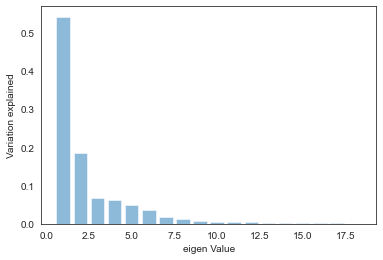

In [28]:
plt.bar(list(range(1,19)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

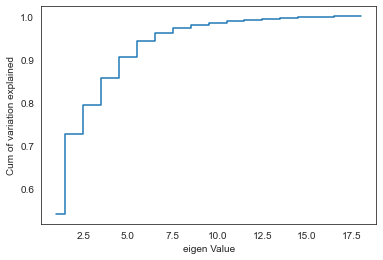

In [29]:
plt.step(list(range(1,19)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

#### Dimensionality Reduction

In [30]:
# 6 should be the ideal number since it covers 95% of the variation
pca2 = PCA(n_components=6)
pca2.fit(XScaled)
print(pca2.components_)
print(pca2.explained_variance_ratio_)
Xpca2 = pca2.transform(XScaled)

[[ 0.27248054  0.28735601  0.30236453  0.26971318  0.09788952  0.19514964
   0.31029716 -0.30891303  0.30727454  0.27810531  0.29979947  0.30590519
   0.26317669 -0.04225767  0.03596387  0.05883164  0.03792511  0.08470876]
 [-0.08712127  0.13231095 -0.04589754 -0.19759367 -0.25754969 -0.1080129
   0.07518675 -0.01316377  0.08762497  0.12211054  0.07694534  0.0710155
   0.21065614  0.50390812 -0.01569074 -0.0927881  -0.50164563 -0.50751593]
 [-0.03789644 -0.20124344  0.06326921  0.05552673 -0.063336   -0.14828409
   0.10927048 -0.09115793  0.10583815 -0.2135114   0.14505149  0.10963794
  -0.20298674  0.07360817 -0.5588378   0.67106115 -0.06243795 -0.04167763]
 [ 0.13854887 -0.03747628  0.10873886 -0.2546962  -0.61298235  0.27910138
   0.00550929  0.06556392  0.03072618  0.04195036 -0.06445155 -0.00200047
  -0.08517399 -0.11589903  0.47410309  0.42716107 -0.02745011  0.09585701]
 [ 0.13679728 -0.13797365 -0.0798038   0.13406825  0.12386561 -0.63481689
   0.08582435 -0.07896459  0.0805236

In [31]:
display(Xpca2)

array([[ 0.58259155, -0.67557811, -0.45545994, -0.7499838 , -0.77595532,
        -1.84862307],
       [-1.51417198, -0.35037559, -0.33158464,  1.26945035, -0.32562816,
        -0.11944638],
       [ 3.91161484,  0.23421085, -1.2663544 ,  0.13847006,  0.91505653,
        -0.68424084],
       ...,
       [ 5.11879258, -0.18260312, -0.51031843, -0.9911918 , -1.32332699,
         0.17083312],
       [-3.29838288, -1.10408753,  1.93429219,  0.4386997 , -0.50169426,
         0.0182249 ],
       [-4.9692385 ,  0.4206769 ,  1.30931553,  0.29067366, -0.17517987,
         0.38515127]])

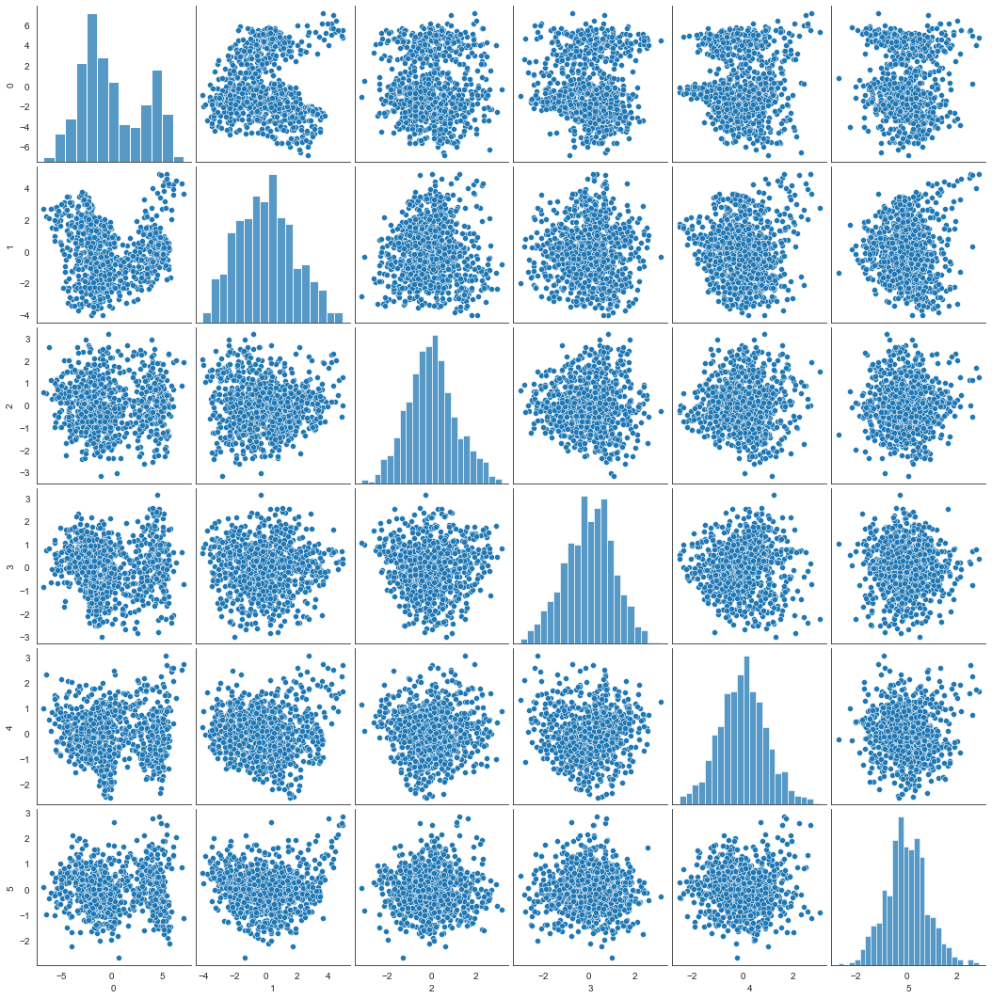

In [32]:
sns.pairplot(pd.DataFrame(Xpca2))

In [33]:
#### Test Train Split 
from sklearn.model_selection import train_test_split
xTrain, xTest, yTrain, yTest = train_test_split(XScaled, Y, test_size = 0.3, random_state = 1)

In [34]:
from sklearn import svm
from sklearn.svm import SVC
svc1Model = SVC(C= .1, kernel='linear', gamma= 'auto')
svc1Model.fit(xTrain, yTrain.values.ravel())
svc1YPredict = svc1Model.predict(xTest)

In [35]:
# check the accuracy
trainAccuracy1 = svc1Model.score(xTrain, yTrain)
print('Train accuracy without PCA: ', trainAccuracy1)
testAccuracy1 = svc1Model.score(xTest, yTest)
print('Test accuracy without PCA: ', testAccuracy1)

Train accuracy without PCA:  0.918918918918919
Test accuracy without PCA:  0.9094488188976378


In [36]:
#Using Xpca2 dataset.
xTrain, xTest, yTrain, yTest = train_test_split(Xpca2, Y, test_size = 0.3, random_state = 1)

In [37]:
svc2Model = SVC(C= .1, kernel='linear', gamma= 'auto')
svc2Model.fit(xTrain, yTrain.values.ravel())
svc2YPredict = svc2Model.predict(xTest)

In [38]:
# check the accuracy
trainAccuracy2 = svc2Model.score(xTrain, yTrain)
print('Train accuracy with PCA: ', trainAccuracy2)
testAccuracy2 = svc2Model.score(xTest, yTest)
print('Test accuracy with PCA: ', testAccuracy2)

Train accuracy with PCA:  0.8327702702702703
Test accuracy with PCA:  0.8228346456692913


### Conclusion

### As per the analysis and model outcome

### Test and Train accuracy of data without PCA is more compared to the test and train accuracy obtained with PCA after performing dimensional reduction